# Research Question: What is the relationship between parks and crime in San Francisco? How does the number of incidents reported relate to the number of parks in a neighborhood? What are the most frequent types of incidents reported in neighborhoods with the lowest amount of parks? Does seaonality and proximity to parks influence the number of incidents reported? 
To answer our research question(s), we are going to take a look at data on incident reports from the SF County Police Department and data on recreation and park spaces from the City of San Francisco. By exploring the data individually, as well as using geospatial visualization tools to overlay the data, we're hoping to get a better understanding of the relationship between reported crime and parks in San Francisco. 

## Why San Francisco?
San Francisco has a wealth of publicly avaialble data via their <a href="https://data.sfgov.org" target="_blank">data.sfgov.org</a> website.

## Why Crime?
The relationship between parks and crime is not novel. Mainstream thinking often perceives parks as spaces that are prime for the occurrence of crime, especially during the nighttime. 

<img src="Screen Shot 2020-11-02 at 9.53.34 PM.png" width=600>

However, many studies have contested this notion and argued that parks are actually enablers of public safety and reduce the incidence of crimes in cities. 

<img src="Screen Shot 2020-11-08 at 1.27.10 AM.png" width=600>

<img src="Screen Shot 2020-11-08 at 1.30.28 AM.png" width=600>

Our research aims to see where along this spectrum the geospatial data actually falls, especially when visualized. 

## What is "Crime"?
It is important to note that the dataset used in our research reflects incidents reported. These are not necessarily incidents that have been charged. Because of this, this dataset does not necessarily reflect "crime" in the way that we are choosing to define crime. Additionally, the dataset included a number of incident categories that do not align with our definition of crime (i.e. prostitution, drug offense, non-criminal). For these reasons, we querried our dataset to reflect certain incidents that would be objectively identified as crime.

In [1]:
# First, let's import all libraries that we will need
import pandas as pd
import geopandas as gpd
import contextily as ctx
import matplotlib.pyplot as plt
import osmnx as ox
import folium
import plotly.express as px
from sodapy import Socrata
from keplergl import KeplerGl

# Querying Data
Let's get started with incident report data. 

## We want to get a sense of the incident report data before moving exploring park data
In previously trying to querry data using Socrata, we had difficulties with query limit. We quickly realized that our dataset had over 400,000 incident reports and that Larceny Theft was among the most common. For this reason we decided to start off by querrying data for just Larceny Theft in the year 2019. 

In [2]:
# Query data from data.sf.gov.org using Socrata
# Since Larceny Theft is the most common and there's a 50,000 query limit we're going to extract that data as it's own dataset
client_crime = Socrata ("data.sfgov.org", None)
results_crime = client_crime.get("wg3w-h783",
                                limit=50000,
                                where= "incident_year = '2019' and incident_category IN ('Larceny Theft')"
                                )
df_crime_LT = pd.DataFrame.from_records(results_crime)
df_crime_LT.shape

(48884, 26)

### There are 48,881 Larceny Theft reports in 2019, just below the 50,000 query limit. Let's leave this dataset to just be Larceny Theft reports. 

In [3]:
# Check to make sure query worked for just Larceny Theft data
df_crime_LT['incident_category'].value_counts()

Larceny Theft    48884
Name: incident_category, dtype: int64

In [4]:
# Check to make sure query worked for just Larceny Theft data
df_crime_LT['incident_year'].value_counts()

2019    48884
Name: incident_year, dtype: int64

### Now lets see if we can lump all other incident types of interest into one dataframe that doesn't exceed the query limit. 

In [5]:
# Query data from data.sfgov.org API on all crime types of interest, excluding Larceny Theft
client_crime2 = Socrata ("data.sfgov.org", None)
results_crime2 = client_crime2.get("wg3w-h783",
                                limit=50000,
                                where= "incident_year = '2019' and incident_category IN ('Arson','Assault','Burglary','Sex Offense','Homicide','Motor Vehicle Theft','Robbery','Offences Against The Family and Children','Family Offenses','Vandalism','Rape','Weapons Offense')"
                                  )
df_crime_multiple = pd.DataFrame.from_records(results_crime2)
df_crime_multiple.shape

(25566, 26)

#### 25,564 incident reports, which is below the limit! Now lets see if the query pulled in the data we wanted. 

In [6]:
# Check that query brought in the data for the categories we wanted...success!
df_crime_multiple['incident_category'].value_counts()

Assault                8893
Burglary               6042
Motor Vehicle Theft    5390
Robbery                3455
Weapons Offense         777
Sex Offense             445
Arson                   313
Vandalism               198
Rape                     38
Homicide                 15
Name: incident_category, dtype: int64

In [7]:
# Check that query brought in data for just 2019
df_crime_multiple['incident_year'].value_counts()

2019    25566
Name: incident_year, dtype: int64

## Now lets combined these two dataframes into one, so we have them all in one place
To take a look at all the data together, we need to combine them into one dataframe

In [8]:
# use the .append fucntion to combine the two dataframes
df_crime_combined = df_crime_LT.append(df_crime_multiple, ignore_index = True) 

In [9]:
# check to make sure nothing funky happened to the columns
df_crime_combined.sample(5)

,incident_datetime,incident_date,incident_time,incident_year,incident_day_of_week,report_datetime,row_id,incident_id,incident_number,cad_number,...,resolution,intersection,cnn,police_district,analysis_neighborhood,supervisor_district,latitude,longitude,point,filed_online
60333,2019-06-22T17:14:00.000,2019-06-22T00:00:00.000,17:14,2019,Saturday,2019-06-22T17:55:00.000,81451307020,814513,190452068,191732797,...,Unfounded,RUTLAND ST \ CAMPBELL AVE,20333000,Ingleside,Visitacion Valley,10,37.71524434385366,-122.40618936856656,"{'latitude': '37.71524434385366', 'longitude':...",NaN
48369,2019-09-15T19:00:00.000,2019-09-15T00:00:00.000,19:00,2019,Sunday,2019-12-27T07:18:00.000,89141206372,891412,196284471,NaN,...,Open or Active,STOCKTON ST \ OFARRELL ST,24902000,Tenderloin,Financial District/South Beach,3,37.786615346301794,-122.40639887891692,"{'latitude': '37.786615346301794', 'longitude'...",True
69851,2019-11-01T07:55:00.000,2019-11-01T00:00:00.000,07:55,2019,Friday,2019-11-01T08:00:00.000,86518804154,865188,190826140,193050917,...,Cite or Arrest Adult,BUENA VISTA AVE EAST \ BUENA VISTA AVE \ BUENA...,26021000,Park,Haight Ashbury,8,37.76900660018903,-122.43833833025136,"{'latitude': '37.76900660018903', 'longitude':...",NaN
6555,2019-02-27T10:54:00.000,2019-02-27T00:00:00.000,10:54,2019,Wednesday,2019-02-27T13:07:00.000,77451906364,774519,190145702,190581459,...,Open or Active,CALIFORNIA ST \ DRUMM ST,30049000,Central,Financial District/South Beach,3,37.793663777154755,-122.39639041612962,"{'latitude': '37.793663777154755', 'longitude'...",NaN
59347,2019-06-07T13:30:00.000,2019-06-07T00:00:00.000,13:30,2019,Friday,2019-06-07T21:45:00.000,80960107021,809601,190411763,191583938,...,Open or Active,FILBERT ST \ SCOTT ST,26874000,Northern,Marina,2,37.79739358570342,-122.44061007843756,"{'latitude': '37.79739358570342', 'longitude':...",NaN


In [10]:
# How large is our combined dataframe?
df_crime_combined.shape

(74450, 26)

In [11]:
# General info on our combined dataframe
df_crime_combined.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74450 entries, 0 to 74449
Data columns (total 26 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   incident_datetime        74450 non-null  object
 1   incident_date            74450 non-null  object
 2   incident_time            74450 non-null  object
 3   incident_year            74450 non-null  object
 4   incident_day_of_week     74450 non-null  object
 5   report_datetime          74450 non-null  object
 6   row_id                   74450 non-null  object
 7   incident_id              74450 non-null  object
 8   incident_number          74450 non-null  object
 9   cad_number               47967 non-null  object
 10  report_type_code         74450 non-null  object
 11  report_type_description  74450 non-null  object
 12  incident_code            74450 non-null  object
 13  incident_category        74450 non-null  object
 14  incident_subcategory     74450 non-nul

In [12]:
# Let's conver the latitude and longitudes into floats for future mapping purposes
df_crime_combined['latitude'] = df_crime_combined['latitude'].astype(float)
df_crime_combined['longitude'] = df_crime_combined['longitude'].astype(float)
df_crime_combined.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74450 entries, 0 to 74449
Data columns (total 26 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   incident_datetime        74450 non-null  object 
 1   incident_date            74450 non-null  object 
 2   incident_time            74450 non-null  object 
 3   incident_year            74450 non-null  object 
 4   incident_day_of_week     74450 non-null  object 
 5   report_datetime          74450 non-null  object 
 6   row_id                   74450 non-null  object 
 7   incident_id              74450 non-null  object 
 8   incident_number          74450 non-null  object 
 9   cad_number               47967 non-null  object 
 10  report_type_code         74450 non-null  object 
 11  report_type_description  74450 non-null  object 
 12  incident_code            74450 non-null  object 
 13  incident_category        74450 non-null  object 
 14  incident_subcategory  

In [13]:
# Some descriptive stats on types of incidents
df_crime_combined['incident_category'].describe()

count             74450
unique               11
top       Larceny Theft
freq              48884
Name: incident_category, dtype: object

In [14]:
# Some descriptive stats on neighborhoods
df_crime_combined['analysis_neighborhood'].describe()

count                              69406
unique                                42
top       Financial District/South Beach
freq                                7680
Name: analysis_neighborhood, dtype: object

In [15]:
# Some descriptive stats on date of incidents
df_crime_combined['incident_date'].describe()

count                       74450
unique                        365
top       2019-06-30T00:00:00.000
freq                          350
Name: incident_date, dtype: object

In [16]:
# First 10 rows
df_crime_combined.head(10)

,incident_datetime,incident_date,incident_time,incident_year,incident_day_of_week,report_datetime,row_id,incident_id,incident_number,cad_number,...,resolution,intersection,cnn,police_district,analysis_neighborhood,supervisor_district,latitude,longitude,point,filed_online
0,2019-02-14T21:15:00.000,2019-02-14T00:00:00.000,21:15,2019,Thursday,2019-02-14T21:15:00.000,97916706303,979167,190113232,190453849,...,Exceptional Adult,HAYES ST \ BUCHANAN ST,25933000,Northern,Hayes Valley,5,37.776254,-122.427914,"{'latitude': '37.77625366680294', 'longitude':...",NaN
1,2019-11-29T21:05:00.000,2019-11-29T00:00:00.000,21:05,2019,Friday,2020-11-10T14:16:00.000,97767606244,977676,190902013,NaN,...,Open or Active,GOUGH ST \ LINDEN ST,25917000,Northern,Hayes Valley,5,37.776416,-122.422883,"{'latitude': '37.776415816714724', 'longitude'...",True
2,2019-11-08T10:44:00.000,2019-11-08T00:00:00.000,10:44,2019,Friday,2020-11-08T10:46:00.000,97656906363,976569,200674724,203131047,...,Cite or Arrest Adult,GEARY BLVD \ 16TH AVE,27487000,Richmond,Outer Richmond,1,37.780529,-122.475084,"{'latitude': '37.780528533424686', 'longitude'...",NaN
3,2019-01-01T12:00:00.000,2019-01-01T00:00:00.000,12:00,2019,Tuesday,2020-11-05T19:10:00.000,97586106381,975861,200669139,203102887,...,Open or Active,BRANNAN ST \ DELANCEY ST,23600000,Southern,Financial District/South Beach,6,37.783609,-122.389846,"{'latitude': '37.783609175905454', 'longitude'...",NaN
4,2019-01-01T00:00:00.000,2019-01-01T00:00:00.000,00:00,2019,Tuesday,2020-11-04T00:02:00.000,97595206372,975952,206154477,NaN,...,Open or Active,BERRY ST \ 05TH ST,23818000,Southern,Mission Bay,6,37.774031,-122.395577,"{'latitude': '37.77403085060099', 'longitude':...",True
5,2019-08-16T17:00:00.000,2019-08-16T00:00:00.000,17:00,2019,Friday,2020-01-31T15:17:00.000,97544306381,975443,200077930,200312404,...,Unfounded,UNION ST \ SCOTT ST,26873000,Northern,Marina,2,37.796461,-122.440422,"{'latitude': '37.79646144154291', 'longitude':...",NaN
6,2019-08-11T12:15:00.000,2019-08-11T00:00:00.000,12:15,2019,Sunday,2020-10-30T11:00:00.000,97397506364,973975,190588748,NaN,...,Cite or Arrest Adult,GEARY ST \ GRANT AVE,24655000,Central,Financial District/South Beach,3,37.787765,-122.405041,"{'latitude': '37.787765494696465', 'longitude'...",NaN
7,2019-07-03T14:00:00.000,2019-07-03T00:00:00.000,14:00,2019,Wednesday,2020-10-26T12:31:00.000,97286006374,972860,200646002,203001548,...,Open or Active,POLK ST \ CEDAR ST,25199000,Northern,Tenderloin,6,37.786359,-122.419833,"{'latitude': '37.786358950426', 'longitude': '...",NaN
8,2019-12-01T09:00:00.000,2019-12-01T00:00:00.000,09:00,2019,Sunday,2020-10-26T16:05:00.000,97292506374,972925,200647345,203002275,...,Open or Active,TURK ST \ STEINER ST,26048000,Northern,Western Addition,5,37.780287,-122.433785,"{'latitude': '37.780286693819114', 'longitude'...",NaN
9,2019-09-01T01:00:00.000,2019-09-01T00:00:00.000,01:00,2019,Sunday,2020-10-21T16:01:00.000,97252206374,972522,190684794,NaN,...,Open or Active,GOUGH ST \ HAIGHT ST \ MARKET ST,30753000,Southern,Hayes Valley,5,37.773036,-122.421941,"{'latitude': '37.77303605003146', 'longitude':...",True


In [17]:
# Last 10 rows
df_crime_combined.tail(10)

,incident_datetime,incident_date,incident_time,incident_year,incident_day_of_week,report_datetime,row_id,incident_id,incident_number,cad_number,...,resolution,intersection,cnn,police_district,analysis_neighborhood,supervisor_district,latitude,longitude,point,filed_online
74440,2019-11-05T12:39:00.000,2019-11-05T00:00:00.000,12:39,2019,Tuesday,2020-07-20T07:54:00.000,94541204014,945412,190034359,193091939,...,Open or Active,WISCONSIN ST \ 22ND ST,23705000,Bayview,Potrero Hill,10,37.757301,-122.398939,"{'latitude': '37.75730094770081', 'longitude':...",NaN
74441,2019-11-05T12:39:00.000,2019-11-05T00:00:00.000,12:39,2019,Tuesday,2020-07-20T07:54:00.000,94541204134,945412,190034359,193091939,...,Open or Active,WISCONSIN ST \ 22ND ST,23705000,Bayview,Potrero Hill,10,37.757301,-122.398939,"{'latitude': '37.75730094770081', 'longitude':...",NaN
74442,2019-06-28T15:00:00.000,2019-06-28T00:00:00.000,15:00,2019,Friday,2020-07-20T09:46:00.000,94546814020,945468,200433138,202020900,...,Cite or Arrest Adult,BOARDMAN PL \ BRYANT ST,23914000,Southern,South of Market,6,37.775161,-122.403636,"{'latitude': '37.7751608100771', 'longitude': ...",NaN
74443,2019-08-17T16:00:00.000,2019-08-17T00:00:00.000,16:00,2019,Saturday,2019-08-17T20:14:00.000,94549904138,945499,190607376,192293560,...,Cite or Arrest Adult,BLYTHDALE AVE \ BROOKDALE AVE,20431000,Bayview,Visitacion Valley,10,37.711317,-122.422241,"{'latitude': '37.71131669257075', 'longitude':...",NaN
74444,2019-09-14T21:18:00.000,2019-09-14T00:00:00.000,21:18,2019,Saturday,2019-09-14T21:18:00.000,94614312027,946143,190489992,191880014,...,Cite or Arrest Adult,04TH ST \ LONG BRIDGE ST,34168000,Out of SF,Mission Bay,6,37.773467,-122.391434,"{'latitude': '37.773466920607476', 'longitude'...",NaN
74445,2019-09-15T23:00:00.000,2019-09-15T00:00:00.000,23:00,2019,Sunday,2020-07-22T12:31:00.000,94614804012,946148,190696266,192603818,...,Open or Active,WHEAT ST \ PAUL AVE,20575000,Bayview,Bayview Hunters Point,10,37.723447,-122.400073,"{'latitude': '37.72344678051801', 'longitude':...",NaN
74446,2019-12-27T17:00:00.000,2019-12-27T00:00:00.000,17:00,2019,Friday,2020-07-27T18:05:00.000,94756203014,947562,200449812,202092578,...,Open or Active,GRANT AVE \ GREEN ST,25326000,Central,North Beach,3,37.799704,-122.407395,"{'latitude': '37.79970367508504', 'longitude':...",NaN
74447,2019-12-28T18:00:00.000,2019-12-28T00:00:00.000,18:00,2019,Saturday,2020-08-02T15:31:00.000,94929107023,949291,200462284,202151710,...,Open or Active,BEULAH ST \ COLE ST,26411000,Park,Haight Ashbury,5,37.767665,-122.450335,"{'latitude': '37.76766488028409', 'longitude':...",NaN
74448,2019-04-28T13:00:00.000,2019-04-28T00:00:00.000,13:00,2019,Sunday,2020-08-07T16:40:00.000,95081907026,950819,200473253,202202321,...,Open or Active,SANTIAGO ST \ 24TH AVE,23262000,Out of SF,Sunset/Parkside,4,37.744681,-122.481181,"{'latitude': '37.744681182378415', 'longitude'...",NaN
74449,2019-07-01T05:00:00.000,2019-07-01T00:00:00.000,05:00,2019,Monday,2020-08-10T09:43:00.000,95154807023,951548,190481459,NaN,...,Open or Active,INNES AVE \ EARL ST,20041000,Bayview,Bayview Hunters Point,10,37.729874,-122.372006,"{'latitude': '37.72987387412528', 'longitude':...",NaN


In [18]:
# Let's trim our dataframe to only have the columns we want
desired_columns = ['incident_datetime', 'incident_category','incident_date','incident_time','incident_year','incident_day_of_week','incident_id','analysis_neighborhood','latitude','longitude','point']
df_crime_combined = df_crime_combined[desired_columns]

In [19]:
# Check to make sure columns were trimmed
df_crime_combined.head(5)

,incident_datetime,incident_category,incident_date,incident_time,incident_year,incident_day_of_week,incident_id,analysis_neighborhood,latitude,longitude,point
0,2019-02-14T21:15:00.000,Larceny Theft,2019-02-14T00:00:00.000,21:15,2019,Thursday,979167,Hayes Valley,37.776254,-122.427914,"{'latitude': '37.77625366680294', 'longitude':..."
1,2019-11-29T21:05:00.000,Larceny Theft,2019-11-29T00:00:00.000,21:05,2019,Friday,977676,Hayes Valley,37.776416,-122.422883,"{'latitude': '37.776415816714724', 'longitude'..."
2,2019-11-08T10:44:00.000,Larceny Theft,2019-11-08T00:00:00.000,10:44,2019,Friday,976569,Outer Richmond,37.780529,-122.475084,"{'latitude': '37.780528533424686', 'longitude'..."
3,2019-01-01T12:00:00.000,Larceny Theft,2019-01-01T00:00:00.000,12:00,2019,Tuesday,975861,Financial District/South Beach,37.783609,-122.389846,"{'latitude': '37.783609175905454', 'longitude'..."
4,2019-01-01T00:00:00.000,Larceny Theft,2019-01-01T00:00:00.000,00:00,2019,Tuesday,975952,Mission Bay,37.774031,-122.395577,"{'latitude': '37.77403085060099', 'longitude':..."


In [20]:
# Double check!
df_crime_combined.shape

(74450, 11)

### Now lets plot this incident report data!

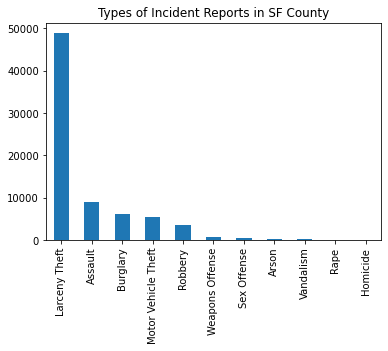

In [21]:
# Create a bar chart for the types of incidents and how many times each one was reported in 2019
df_crime_combined['incident_category'].value_counts().plot.bar(x='incident_category',y='count',title='Types of Incident Reports in SF County')

#### We can tell here that larceny theft is in fact the most common incident reported, followed by assault and burglary. Occurrences of larceny theft exceed those of other incidents by nearly 5 times, thus it might be interesting to take a look at larceny theft from different angles, including seasonally and proximity to parks.  

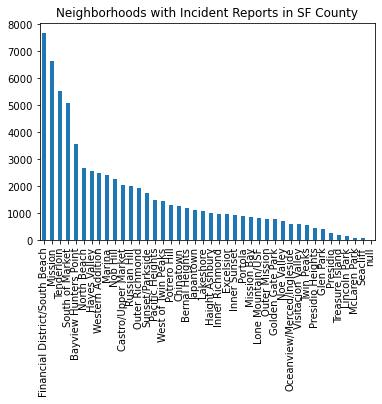

In [22]:
# Create a bar chart for the number of incidents reported in each neighborhood
# This looks really squished so we'll make a nicer looking one in a bit
df_crime_combined['analysis_neighborhood'].value_counts().plot.bar(x='analysis_neighborhood',y='count',title='Neighborhoods with Incident Reports in SF County')

#### Although this chart is hard to read at some points, it reveals an important piece of information: the Financial District/South Beach neighborhood experiences the most incident reports in 2019. Taking a look at park data in conjunction with this data will help to uncover a relationship, if any, between our two variables. 

## Now let's look at seasonality of the incident reports
Seasonal patterns in certain types of crime do exist, and studies show that the summer season often experiences the highest rates of crime. We want to see if San Francisco incident report data reflects this as well. 

In [23]:
# Found this function online and it seems to work, or at least not return an error message
# Summer
df_crime_summer=df_crime_combined['incident_date'].between('2019-07-01T00:00:00.000','2019-10-01T00:00:00.000')
df_crime_summer=df_crime_combined[df_crime_summer]

In [24]:
# First five are within the time frame
df_crime_summer.head(5).reset_index()

,index,incident_datetime,incident_category,incident_date,incident_time,incident_year,incident_day_of_week,incident_id,analysis_neighborhood,latitude,longitude,point
0,5,2019-08-16T17:00:00.000,Larceny Theft,2019-08-16T00:00:00.000,17:00,2019,Friday,975443,Marina,37.796461,-122.440422,"{'latitude': '37.79646144154291', 'longitude':..."
1,6,2019-08-11T12:15:00.000,Larceny Theft,2019-08-11T00:00:00.000,12:15,2019,Sunday,973975,Financial District/South Beach,37.787765,-122.405041,"{'latitude': '37.787765494696465', 'longitude'..."
2,7,2019-07-03T14:00:00.000,Larceny Theft,2019-07-03T00:00:00.000,14:00,2019,Wednesday,972860,Tenderloin,37.786359,-122.419833,"{'latitude': '37.786358950426', 'longitude': '..."
3,9,2019-09-01T01:00:00.000,Larceny Theft,2019-09-01T00:00:00.000,01:00,2019,Sunday,972522,Hayes Valley,37.773036,-122.421941,"{'latitude': '37.77303605003146', 'longitude':..."
4,10,2019-08-15T13:31:00.000,Larceny Theft,2019-08-15T00:00:00.000,13:31,2019,Thursday,972300,Financial District/South Beach,37.788427,-122.403580,"{'latitude': '37.78842726061901', 'longitude':..."


### Now let's create dataframes for every season
We've figured out how to create separate dataframes for each season, so let's continue for the other three seasons. 
NOTE: dates for seasons were created arbitrarily based on months that are typically associated with certain seasons. 

In [25]:
# Fall
df_crime_fall=df_crime_combined['incident_date'].between('2019-10-01T00:00:00.000','2020-01-01T00:00:00.000')
df_crime_fall = df_crime_combined[df_crime_fall]

In [26]:
df_crime_fall.head(5).reset_index()

,index,incident_datetime,incident_category,incident_date,incident_time,incident_year,incident_day_of_week,incident_id,analysis_neighborhood,latitude,longitude,point
0,1,2019-11-29T21:05:00.000,Larceny Theft,2019-11-29T00:00:00.000,21:05,2019,Friday,977676,Hayes Valley,37.776416,-122.422883,"{'latitude': '37.776415816714724', 'longitude'..."
1,2,2019-11-08T10:44:00.000,Larceny Theft,2019-11-08T00:00:00.000,10:44,2019,Friday,976569,Outer Richmond,37.780529,-122.475084,"{'latitude': '37.780528533424686', 'longitude'..."
2,8,2019-12-01T09:00:00.000,Larceny Theft,2019-12-01T00:00:00.000,09:00,2019,Sunday,972925,Western Addition,37.780287,-122.433785,"{'latitude': '37.780286693819114', 'longitude'..."
3,11,2019-10-22T08:00:00.000,Larceny Theft,2019-10-22T00:00:00.000,08:00,2019,Tuesday,972074,Bayview Hunters Point,37.729211,-122.400834,"{'latitude': '37.72921143709946', 'longitude':..."
4,14,2019-11-29T19:40:00.000,Larceny Theft,2019-11-29T00:00:00.000,19:40,2019,Friday,971303,Financial District/South Beach,37.791899,-122.402571,"{'latitude': '37.79189893804923', 'longitude':..."


In [27]:
# Winter
df_crime_winter=df_crime_combined['incident_date'].between('2019-01-01T00:00:00.000','2019-04-01T00:00:00.000')
df_crime_winter = df_crime_combined[df_crime_winter]

In [28]:
df_crime_winter.head(5).reset_index()

,index,incident_datetime,incident_category,incident_date,incident_time,incident_year,incident_day_of_week,incident_id,analysis_neighborhood,latitude,longitude,point
0,0,2019-02-14T21:15:00.000,Larceny Theft,2019-02-14T00:00:00.000,21:15,2019,Thursday,979167,Hayes Valley,37.776254,-122.427914,"{'latitude': '37.77625366680294', 'longitude':..."
1,3,2019-01-01T12:00:00.000,Larceny Theft,2019-01-01T00:00:00.000,12:00,2019,Tuesday,975861,Financial District/South Beach,37.783609,-122.389846,"{'latitude': '37.783609175905454', 'longitude'..."
2,4,2019-01-01T00:00:00.000,Larceny Theft,2019-01-01T00:00:00.000,00:00,2019,Tuesday,975952,Mission Bay,37.774031,-122.395577,"{'latitude': '37.77403085060099', 'longitude':..."
3,13,2019-01-01T12:00:00.000,Larceny Theft,2019-01-01T00:00:00.000,12:00,2019,Tuesday,971438,Bayview Hunters Point,37.729786,-122.391852,"{'latitude': '37.7297855541108', 'longitude': ..."
4,19,2019-03-14T13:00:00.000,Larceny Theft,2019-03-14T00:00:00.000,13:00,2019,Thursday,963716,Hayes Valley,37.773036,-122.421941,"{'latitude': '37.77303605003146', 'longitude':..."


In [29]:
# Spring
df_crime_spring=df_crime_combined['incident_date'].between('2019-04-01T00:00:00.000','2019-07-01T00:00:00.000')
df_crime_spring = df_crime_combined[df_crime_spring]

In [30]:
df_crime_spring.head(5).reset_index()

,index,incident_datetime,incident_category,incident_date,incident_time,incident_year,incident_day_of_week,incident_id,analysis_neighborhood,latitude,longitude,point
0,82,2019-04-01T19:30:00.000,Larceny Theft,2019-04-01T00:00:00.000,19:30,2019,Monday,786287,NaN,NaN,NaN,NaN
1,83,2019-04-03T16:30:00.000,Larceny Theft,2019-04-03T00:00:00.000,16:30,2019,Wednesday,786652,NaN,NaN,NaN,NaN
2,85,2019-04-06T03:01:00.000,Larceny Theft,2019-04-06T00:00:00.000,03:01,2019,Saturday,789229,NaN,NaN,NaN,NaN
3,86,2019-04-09T22:00:00.000,Larceny Theft,2019-04-09T00:00:00.000,22:00,2019,Tuesday,789610,NaN,NaN,NaN,NaN
4,87,2019-04-10T09:50:00.000,Larceny Theft,2019-04-10T00:00:00.000,09:50,2019,Wednesday,789630,NaN,NaN,NaN,NaN


### Let's provide exact numbers for the frequency of each incident within each season

In [31]:
# Summer counts
df_crime_summer['incident_category'].value_counts()

Larceny Theft          13837
Assault                 2406
Burglary                1559
Motor Vehicle Theft     1390
Robbery                  891
Weapons Offense          220
Sex Offense              132
Arson                     90
Vandalism                 60
Rape                       7
Homicide                   1
Name: incident_category, dtype: int64

In [32]:
# Fall counts
df_crime_fall['incident_category'].value_counts()

Larceny Theft          13314
Assault                 2171
Burglary                1510
Motor Vehicle Theft     1434
Robbery                 1018
Weapons Offense          146
Sex Offense               94
Arson                     93
Vandalism                 51
Rape                      11
Homicide                   5
Name: incident_category, dtype: int64

In [33]:
# Winter counts
df_crime_winter['incident_category'].value_counts()

Larceny Theft          10781
Assault                 2073
Burglary                1543
Motor Vehicle Theft     1244
Robbery                  775
Weapons Offense          211
Sex Offense              104
Arson                     66
Vandalism                 39
Rape                      14
Homicide                   2
Name: incident_category, dtype: int64

In [34]:
# Spring counts
df_crime_spring['incident_category'].value_counts()

Larceny Theft          11354
Assault                 2333
Burglary                1487
Motor Vehicle Theft     1367
Robbery                  805
Weapons Offense          207
Sex Offense              119
Arson                     68
Vandalism                 49
Homicide                   7
Rape                       7
Name: incident_category, dtype: int64

#### Again, not surprisingly, larceny theft, assault, and burglary were the three most common incidents. The summer month did experience the highest number for each of these three incidents. But this is hard to see in this form, so let's visualize this. 

### Let's create some interactive charts with the incident report data

In [35]:
# Summer
# Create a new data frame that includes the variables we need
df_crime_summer_count=df_crime_summer.groupby(['incident_category','analysis_neighborhood'])['incident_id'].count().reset_index(name="count")
df_crime_summer_count.head(5)

,incident_category,analysis_neighborhood,count
0,Arson,Bayview Hunters Point,12
1,Arson,Bernal Heights,2
2,Arson,Castro/Upper Market,1
3,Arson,Chinatown,1
4,Arson,Financial District/South Beach,11


In [36]:
px.bar(df_crime_summer_count,
      x = 'analysis_neighborhood',
      y= 'count',
       color='incident_category',
      labels= {'incident_category': 'Type of Incident', 'count':'Count', 'analysis_neighborhood': 'Neighborhood'},
      title = 'Types of Incidents in Summer 2019 by Neighborhood')

#### Here we can see again that our previous two findings, larceny theft being the most common incident and Financial District/South Beach being the neighborhood with the most reports, are reflected in this stacked bar chart. It's also interesting to see that assault takes up a larger share of incidents in some neighborhoods as opposed to others.

### Let's try and create a function that will allow us to create stacked bar charts for the other seasons as well. 

In [37]:
def season_chart (df):
    # Create a new dataframe grouped by our variables of interest
    df_crime_count=df.groupby(['analysis_neighborhood','incident_category'])['incident_id'].count().reset_index(name="count")
    
    # Create a stacked bar chart
    chart = px.bar(df_crime_count,
          x = 'analysis_neighborhood',
          y= 'count',
           color='incident_category',
          labels= {'incident_category': 'Type of Incident', 'count':'Count', 'analysis_neighborhood': 'Neighborhood'},
          title = 'Types of Incidents in 2019')
    chart.show()

In [38]:
season_chart(df_crime_summer)

In [39]:
season_chart(df_crime_winter)

In [40]:
season_chart(df_crime_fall)

In [41]:
season_chart(df_crime_spring)

#### The patterns observed in the summer dataframe appear similar to those of other seasons. Larceny theft is still the most common incident reported and Financial District/South Beach, Mission, Tenderloin, and South of Market are the top neighborhoods with the most reported incidents.

### Our function worked! Only thing we need to figure out is how to include the title in the function to reflect each season. 

#### Working on looking at creating a new column for the df_crime_combined dataframe that categorizes incidents by the season they occurred in so that we can create a stacked bar chart that's colored by season. 

## Let's pivot to looking deeper at data on incident date and incident types.

In [42]:
df_crime_combined_date=df_crime_combined.groupby(['incident_date','analysis_neighborhood'])['incident_id'].count().reset_index(name="count")
df_crime_combined_date.head(5)

,incident_date,analysis_neighborhood,count
0,2019-01-01T00:00:00.000,Bayview Hunters Point,11
1,2019-01-01T00:00:00.000,Bernal Heights,3
2,2019-01-01T00:00:00.000,Castro/Upper Market,5
3,2019-01-01T00:00:00.000,Chinatown,4
4,2019-01-01T00:00:00.000,Excelsior,1


In [43]:
# Create a line graph that represents the date of incidents in SF county
# Need to figure out how to save a plotly chart
px.line(df_crime_combined_date,
      x='incident_date',
       y='count',
      title='Number of Incident Reports in SF County by Date in 2019',
      labels={'analysis_neighborhood':'Neighborhood','count':'Count','incident_date':'Date of Incident'})

### Findings Based on Date of Incident
It seems like incidents reported take a sharp around holidays like Thanksgiving and Christmas, which is expected. However, the one date that jumps out immediately is June 30. While this lines up with the studies that reveal summer months to experience higher rates of crime, this date staggers well above other summer dates. A brief Google search of "June 30, 2019 San Francisco" revealed no information that could explain why this might be the case. 

In [44]:
# Create a line graph that reprsents the date of incidents in each neighborhood in SF county
# Need to figure out how to save a plotly chart
px.line(df_crime_combined_date,
      x='incident_date',
       y='count',
        color='analysis_neighborhood',
      title='Number of Incident Reports per Neighborhood in SF County by Date in 2019',
      labels={'analysis_neighborhood':'Neighborhood','count':'Count','incident_date':'Date of Incident'})

#### Dividing data on incident dates by neighborhood shows that the incident reports on June 30, 2019 took place overwhelmingly in the Tenderloin neighobrhood. After some more research, it was found that San Francisco Pride was celebrated on June 30, 2019 in Civic Center Plaza from 11:00am to 6:00pm, which is directly adjacent to the Tenderloin area. Assuming a large enough crowd, it is possible that SF Pride activities spilled over into Tenderloin. However, the nature of the incidents is unclear. Whether the incidents reported were by those participating in pride or by those not is important to know and undiscernable using this data. We can however look at the make up of the incident reports for that June 30, 2019 in Tenderloin. 

### So let's look at the data for June 30, 2019 in Tenderloin and see what we can find. 

In [45]:
# Call data for incident reports in the Tenderloin neighborhood in 2019
df_crime_Tenderloin = df_crime_combined[df_crime_combined.analysis_neighborhood == 'Tenderloin']
df_crime_Tenderloin

,incident_datetime,incident_category,incident_date,incident_time,incident_year,incident_day_of_week,incident_id,analysis_neighborhood,latitude,longitude,point
7,2019-07-03T14:00:00.000,Larceny Theft,2019-07-03T00:00:00.000,14:00,2019,Wednesday,972860,Tenderloin,37.786359,-122.419833,"{'latitude': '37.786358950426', 'longitude': '..."
30,2019-12-25T21:00:00.000,Larceny Theft,2019-12-25T00:00:00.000,21:00,2019,Wednesday,957438,Tenderloin,37.782894,-122.420817,"{'latitude': '37.78289412114938', 'longitude':..."
297,2019-01-01T21:20:00.000,Larceny Theft,2019-01-01T00:00:00.000,21:20,2019,Tuesday,754640,Tenderloin,37.784141,-122.410952,"{'latitude': '37.78414101130419', 'longitude':..."
300,2019-01-01T23:15:00.000,Larceny Theft,2019-01-01T00:00:00.000,23:15,2019,Tuesday,754665,Tenderloin,37.786566,-122.418179,"{'latitude': '37.78656598262375', 'longitude':..."
316,2019-01-01T21:30:00.000,Larceny Theft,2019-01-01T00:00:00.000,21:30,2019,Tuesday,754849,Tenderloin,37.786520,-122.414807,"{'latitude': '37.78651981906591', 'longitude':..."
...,...,...,...,...,...,...,...,...,...,...,...
74365,2019-12-14T15:00:00.000,Motor Vehicle Theft,2019-12-14T00:00:00.000,15:00,2019,Saturday,906964,Tenderloin,37.784453,-122.408493,"{'latitude': '37.78445272883687', 'longitude':..."
74415,2019-04-27T08:53:00.000,Burglary,2019-04-27T00:00:00.000,08:53,2019,Saturday,922795,Tenderloin,37.786520,-122.414807,"{'latitude': '37.78651981906591', 'longitude':..."
74419,2019-12-28T00:00:00.000,Motor Vehicle Theft,2019-12-28T00:00:00.000,00:00,2019,Saturday,924722,Tenderloin,37.784501,-122.419455,"{'latitude': '37.78450084289595', 'longitude':..."
74423,2019-12-25T00:01:00.000,Robbery,2019-12-25T00:00:00.000,00:01,2019,Wednesday,928912,Tenderloin,37.785893,-122.419739,"{'latitude': '37.78589290013101', 'longitude':..."


In [46]:
# Create a new dataframe for incident reports on June 30, 2019 in the Tenderloin neighborhood
df_crime_pride = df_crime_Tenderloin[df_crime_Tenderloin.incident_date == '2019-06-30T00:00:00.000']
df_crime_pride

,incident_datetime,incident_category,incident_date,incident_time,incident_year,incident_day_of_week,incident_id,analysis_neighborhood,latitude,longitude,point
20923,2019-06-30T09:10:00.000,Larceny Theft,2019-06-30T00:00:00.000,09:10,2019,Sunday,817137,Tenderloin,37.786828,-122.419928,"{'latitude': '37.78682752578904', 'longitude':..."
20932,2019-06-30T14:00:00.000,Larceny Theft,2019-06-30T00:00:00.000,14:00,2019,Sunday,817156,Tenderloin,37.778719,-122.414741,"{'latitude': '37.77871942789032', 'longitude':..."
20938,2019-06-30T15:05:00.000,Larceny Theft,2019-06-30T00:00:00.000,15:05,2019,Sunday,817171,Tenderloin,37.778719,-122.414741,"{'latitude': '37.77871942789032', 'longitude':..."
20950,2019-06-30T14:00:00.000,Larceny Theft,2019-06-30T00:00:00.000,14:00,2019,Sunday,817205,Tenderloin,37.778719,-122.414741,"{'latitude': '37.77871942789032', 'longitude':..."
20954,2019-06-30T12:35:00.000,Larceny Theft,2019-06-30T00:00:00.000,12:35,2019,Sunday,817216,Tenderloin,37.779992,-122.413487,"{'latitude': '37.77999173926721', 'longitude':..."
...,...,...,...,...,...,...,...,...,...,...,...
61045,2019-06-30T17:00:00.000,Assault,2019-06-30T00:00:00.000,17:00,2019,Sunday,818203,Tenderloin,37.780773,-122.418709,"{'latitude': '37.780773160648025', 'longitude'..."
61073,2019-06-30T17:00:00.000,Assault,2019-06-30T00:00:00.000,17:00,2019,Sunday,818395,Tenderloin,37.780773,-122.418709,"{'latitude': '37.780773160648025', 'longitude'..."
61126,2019-06-30T19:00:00.000,Robbery,2019-06-30T00:00:00.000,19:00,2019,Sunday,818618,Tenderloin,37.778719,-122.414741,"{'latitude': '37.77871942789032', 'longitude':..."
61433,2019-06-30T18:30:00.000,Assault,2019-06-30T00:00:00.000,18:30,2019,Sunday,820144,Tenderloin,37.780470,-122.416948,"{'latitude': '37.780470340397024', 'longitude'..."


In [47]:
# Let's get a count for the types of crime by incident time to see if incidents line up with the time of the celebration
df_crime_pride_count=df_crime_pride.groupby(['incident_category','incident_time'])['incident_id'].count().reset_index(name="count")
df_crime_pride_count

,incident_category,incident_time,count
0,Assault,13:25,1
1,Assault,16:30,1
2,Assault,16:49,1
3,Assault,17:00,3
4,Assault,18:30,1
5,Assault,19:22,1
6,Burglary,04:01,1
7,Larceny Theft,09:00,1
8,Larceny Theft,09:10,1
9,Larceny Theft,12:15,1


In [48]:
df_crime_pride_count['incident_category'].describe()

count                47
unique                5
top       Larceny Theft
freq                 35
Name: incident_category, dtype: object

In [49]:
df_crime_pride_count['incident_time'].describe()

count        47
unique       43
top       16:30
freq          2
Name: incident_time, dtype: object

In [50]:
px.bar(df_crime_pride_count,
      x = 'incident_category',
      y= 'count',
       color='incident_time',
      labels= {'incident_category': 'Type of Incident', 'count':'Count', 'incident_time':'Time of Incident'},
      title = "Types of Incidents in San Francisco's Tenderloin Neighborhood on June 30, 2019")

#### Again, unsurprisingly larceny theft was the most commonly reported crime on June 30, 2019 in Tenderloin, followed by Assault. Larceny theft accounted for 35 of 46 crimes reported. Only 12 of the reported incidents occurred outside of the advertised time of the Pride celebration, but of those 12, five occurred within an hour of the Pride celebration's advertised time. 

#### We can tell that there are certain times where the most incidents were recorded. For example, 1pm, 2pm, 3:30pm, and 5pm. This would be during the peak of the pride celebration. Perhaps the large crowd was more conducive to crime-like activity, especially larceny theft. This finding could potentially suggest that parks that are host large events, like concerts, or that experience a lot of foot traffic (i.e. Mission Dolores) could experience more crime activity. Perhaps parks of a certain size are more likely to have more incident reports? Or maybe parks that have more visitors are likely to have more incident reports? The latter of these would be hard to gather public data on, but perhaps the former is one worth exploring further. 

### Let's use our function from before and see how it works out on the df_crime_pride dataframe. 
Need to address title issue.

In [51]:
season_chart(df_crime_pride)

#### This chart shows what we already knew, larceny theft accounted for a large share of incidents reported in Tenderloin on June 30, 2019

### Now, let's look at the types of incidents by neighborhood. 
We'll create a new dataframe that reflects the counts for each incident report per neighborhood.

In [52]:
df_crime_combined_cat=df_crime_combined.groupby(['incident_category','analysis_neighborhood'])['incident_id'].count().reset_index(name="count")
df_crime_combined_cat.head(5)

,incident_category,analysis_neighborhood,count
0,Arson,Bayview Hunters Point,47
1,Arson,Bernal Heights,4
2,Arson,Castro/Upper Market,8
3,Arson,Chinatown,15
4,Arson,Excelsior,4


In [53]:
# Create a bar graph that represents the type of incidents in each neighborhood in SF county
# Need to figure out how to save a plotly chart
px.bar(df_crime_combined_cat,
      x='analysis_neighborhood',
       y='count',
        color='incident_category',
      title='Type of Incident Reports per Neighborhood in SF County in 2019',
      labels={'analysis_neighborhood':'Neighborhood','count':'Count','incident_category':'Type of Incident'})

#### This graph comprehensively pulls together our seasonal findings about the most common incidents and the neighborhoods with the most reports. 

### Let's explore what incident report data looks like for each day of the week. 
Are there certain days of the week that are experience a greater number of incident reports? Looking at how this might relate to park use, people are more likely to use parks during weekends. 

In [54]:
# Create a dataframe with the count for types of incidents for every day of the week
df_crime_combined_dot=df_crime_combined.groupby(['incident_day_of_week','incident_category'])['incident_id'].count().reset_index(name="count")
df_crime_combined_dot.head(5)

,incident_day_of_week,incident_category,count
0,Friday,Arson,55
1,Friday,Assault,1272
2,Friday,Burglary,968
3,Friday,Homicide,1
4,Friday,Larceny Theft,7801


In [55]:
df_crime_combined['incident_day_of_week'].describe()

count      74450
unique         7
top       Friday
freq       11641
Name: incident_day_of_week, dtype: object

In [56]:
# Create a bar graph that represents the type of incidents for each day of the week in SF county
# Need to figure out how to save a plotly chart
px.bar(df_crime_combined_dot,
      x='incident_day_of_week',
       y='count',
        color='incident_category',
      title='Type of Incident Reports for Each Day of the Week in SF County in 2019',
      labels={'incident_day_of_week':'Day of the Week','count':'Count','incident_category':'Type of Incident'})

#### We see that Friday, Saturday, and Wednesday witnessed the most incident reports in 2019. As previously mentioned, this could potentially line up with data on parks. We'll have to look at the parks data before making any assumptions.

# Now that we have a good understanding of the incident report, let's get mapping!

## First, convert every incident report dataframe into a GeoDataFrame. Use a function!

In [57]:
crime_combined_gdf = gpd.GeoDataFrame(
    df_crime_combined, geometry=gpd.points_from_xy(df_crime_combined.longitude, df_crime_combined.latitude))
crime_summer_gdf = gpd.GeoDataFrame(
    df_crime_summer, geometry=gpd.points_from_xy(df_crime_summer.longitude, df_crime_summer.latitude))
crime_fall_gdf = gpd.GeoDataFrame(
    df_crime_fall, geometry=gpd.points_from_xy(df_crime_fall.longitude, df_crime_fall.latitude))
crime_winter_gdf = gpd.GeoDataFrame(
    df_crime_winter, geometry=gpd.points_from_xy(df_crime_winter.longitude, df_crime_winter.latitude))
crime_spring_gdf = gpd.GeoDataFrame(
    df_crime_spring, geometry=gpd.points_from_xy(df_crime_spring.longitude, df_crime_spring.latitude))

## Let's create a function that converts our pandas dataframes to GeoDataFrames. 

In [58]:
def df_to_gdf(df_crime_name):
    gdf = gpd.GeoDataFrame(
        df_crime_name, geometry=gpd.points_from_xy(df_crime_name.longitude, df_crime_name.latitude))

In [59]:
df_to_gdf(df_crime_summer)

In [60]:
df_to_gdf(df_crime_fall)

In [61]:
df_to_gdf(df_crime_winter)

In [62]:
df_to_gdf(df_crime_spring)

In [63]:
df_to_gdf(df_crime_pride)

## Start plotting incident reports

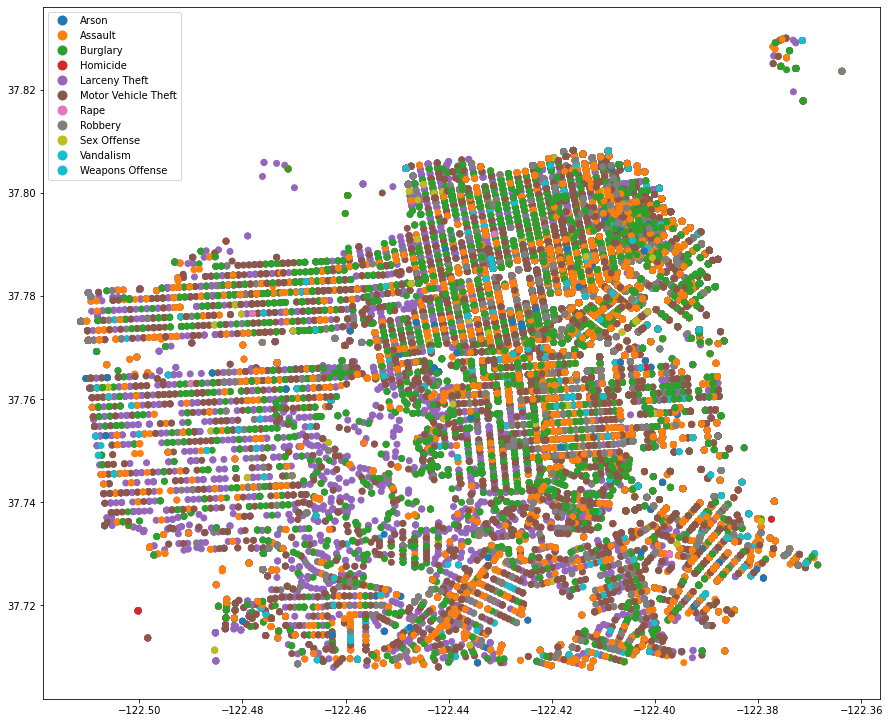

In [64]:
ax = crime_combined_gdf.plot(figsize=(15,15),
                            column='incident_category',
                            legend=True)
# How can we add a title?

#### This plot is a bit overwhelming. It doesn't tell us much other than that incident reports take place across SF county, but there are some obvious pockets where there are no reports. So let's create interactive maps that allow us to zoom in and observe our data on a more granular level. 

## Let's create interactive maps with the data using plotly. 

In [65]:
# Map the entire dataset
fig_combined= px.scatter_mapbox(df_crime_combined, 
                        lat='latitude', 
                        lon='longitude', 
                        color='incident_category'
                       )
fig_combined.update_layout(mapbox_style="carto-darkmatter")

fig_combined.show()

### In this case, even when we zoom in really close, it's hard to deceifer any kind of geographic characteristic for these incidents. Even if we were to overlay park data on top of this map, we wouldn't be able to tell much. What we can tell is that the western part of the city seems to have a higher concentration of larceny theft, while the north eastern part of the city seems to have a higher concentration of assault and wespons offense.  Nonetheless, let's look at smaller datasets. 

In [66]:
# Map the incident report data for summer 2019
fig_summer= px.scatter_mapbox(df_crime_summer, 
                        lat='latitude', 
                        lon='longitude', 
                        color='incident_category'
                       )
fig_summer.update_layout(mapbox_style="carto-darkmatter")

fig_summer.show()

### We can already tell that there seems to be many more reports on the eastern part of the city compared to the western. We can also tell that most of Golden Gate Park has very little incidents reported in the summer of 2019 (the same could be said about the neighborhood in the larger dataframe). This perhaps hints at our initial research question, but could very well be an outlier given the size and touristic attraction of the park. 

In [67]:
# Let's map the incident reports from June 30, 2019 in Tenderloin
fig_pride= px.scatter_mapbox(df_crime_pride, 
                        lat='latitude', 
                        lon='longitude', 
                        color='incident_category'
                       )
fig_pride.update_layout(mapbox_style="carto-darkmatter")

fig_pride.show()

### Within a two block radius of the Civic Center Plaza we can see that there are 3 assault, 1 robbery,and 4 larceny theft reports. Not sure that this map tells us much beyond that. There are also only 27 incidents mapped, meaning 19 had no coordinates in the dataset. 

# Now that we have a good understanding of the incident report data, let's take a look at San Francisco recreation and park data
## Importing the Park Data
### San Francisco Recreation and Parks Properties - The data includes land owned and/or maintained by the SF Recreation and Parks Department. 

In [68]:
# This is data for San Francisco Recreation and Park Spaces
parkgeo = gpd.read_file('Recreation and Parks Properties.geojson')

### SF Find Neighborhoods - The data includes neighborhood boundaries that were defined in 2006 by the Mayor's Office of Neighborhood Services

In [69]:
# This is data for San Francisco Neighborhood Boundaries
neighborhoods = gpd.read_file('SF Find Neighborhoods.geojson')

## Getting a First Look at the Data


In [70]:
# How many rows and columns?
parkgeo.shape

(236, 32)

In [71]:
parkgeo.head()

,squarefeet,state_assembly,city,zipcode,acres,propertytype,police_district,realtor_neighborhood,ggp_section,latitude,...,state_senate,ownership,map_label,address,created_user,last_edited_date,psa,last_edited_user,complex,geometry
0,87675.99885853,17th Assembly District,San Francisco,94111,2.01276398,Civic Plaza or Square,Central,Financial District/Barbary Coast,None,37.7955308,...,11th Senatorial District,Real Estate,Maritime Plaza,285 Washington Street,rpdgis,20190329212222,PSA1,RPDGIS@RPDGIS.SFGOV.ORG,North Beach Complex,"MULTIPOLYGON (((-122.39908 37.79596, -122.3982..."
1,26505654.42121903,19th Assembly District,San Francisco,94132,608.4860977,Regional Park,Taraval,Lake Shore,None,37.7219234,...,11th Senatorial District,PUC/Clean Water Program,Lake Merced Park,Lake Merced Boulevard,rpdgis,20190329212222,PSA4,RPDGIS@RPDGIS.SFGOV.ORG,Lake Merced Complex,"MULTIPOLYGON (((-122.48624 37.70816, -122.4862..."
2,6489.2547279,17th Assembly District,San Francisco,94109,0.14897279,Mini Park,Central,Nob Hill,None,37.79642235,...,11th Senatorial District,Public Works,Broadway Tunnel West Mini Park,1201 Broadway,rpdgis,20190329212223,PSA1,RPDGIS@RPDGIS.SFGOV.ORG,North Beach Complex,"MULTIPOLYGON (((-122.41757 37.79649, -122.4175..."
3,1773406.32935865,17th Assembly District,San Francisco,94127,40.71180762,Regional Park,Ingleside,Miraloma Park,None,37.73906281,...,11th Senatorial District,Recreation & Park,Mt. Davidson Park,Myra Way,rpdgis,20190329212223,PSA4,RPDGIS@RPDGIS.SFGOV.ORG,Lake Merced Complex,"MULTIPOLYGON (((-122.45309 37.74097, -122.4530..."
4,113243.32434104,17th Assembly District,San Francisco,94108,2.59970898,Civic Plaza or Square,Central,Downtown,None,37.78793123,...,11th Senatorial District,Recreation & Park,Union Square,Post & Stockton,rpdgis,20190329212223,PSA2,RPDGIS@RPDGIS.SFGOV.ORG,Civic Center/Potrero Hill Complex,"MULTIPOLYGON (((-122.40672 37.78765, -122.4074..."


In [72]:
# Let's see how many properties are in each neighborhood
parkgeo['planning_neighborhood'].value_counts()

Western Addition         19
Mission                  16
Bernal Heights           15
Bayview                  14
Outer Mission            11
Castro/Upper Market      11
Russian Hill              9
Downtown/Civic Center     9
Noe Valley                9
Inner Richmond            8
Lakeshore                 8
Inner Sunset              7
Potrero Hill              7
West of Twin Peaks        7
Nob Hill                  6
Ocean View                6
Outer Richmond            5
Glen Park                 5
Haight Ashbury            5
Parkside                  5
South of Market           5
Visitacion Valley         5
Golden Gate Park          5
Marina                    5
Diamond Heights           4
North Beach               4
Excelsior                 4
Pacific Heights           3
Chinatown                 3
Financial District        3
Twin Peaks                2
Crocker Amazon            2
Seacliff                  2
Outer Sunset              2
Presidio Heights          2
Presidio            

In [73]:
# Let's see the counts for each property type
parkgeo['propertytype'].value_counts()

Neighborhood Park or Playground                 134
Mini Park                                        44
Regional Park                                    18
Community Garden                                 15
Civic Plaza or Square                            10
SF Public Library property                        7
Real Estate/Administrative Services property      2
Parkway                                           2
War Memorial & Performing Arts Center             1
Family Camp                                       1
Concession                                        1
Zoological Garden                                 1
Name: propertytype, dtype: int64

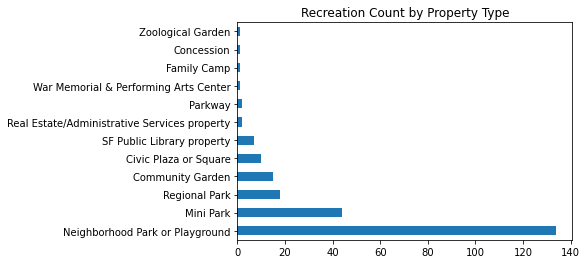

In [74]:
# Wanted to make a chart showing the count of each property type
# We see that Neighborhood Park or Playground, Mini Park, and Regional Park are the most frequent property type
# and they are the most relevant to us so we will isolate those later on
parkgeo['propertytype'].value_counts().plot.barh(title="Recreation Count by Property Type")

This helps us to determine the most common property types and justify condensing the data to contain only Neighborhood Park or Playground, Mini Park, and Regional Park.

In [75]:
parkgeo.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 236 entries, 0 to 235
Data columns (total 32 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   squarefeet             236 non-null    object  
 1   state_assembly         234 non-null    object  
 2   city                   236 non-null    object  
 3   zipcode                236 non-null    object  
 4   acres                  236 non-null    object  
 5   propertytype           236 non-null    object  
 6   police_district        234 non-null    object  
 7   realtor_neighborhood   234 non-null    object  
 8   ggp_section            10 non-null     object  
 9   latitude               236 non-null    object  
 10  created_date           236 non-null    object  
 11  state                  236 non-null    object  
 12  mons_neighborhood      234 non-null    object  
 13  us_congress            234 non-null    object  
 14  land_id                235 non-nul

In [76]:
desired_columns = ['squarefeet',
'latitude',
'longitude',
 'propertytype',
'map_label',
'planning_neighborhood',
 'geometry']

In [77]:
park_trimmed = parkgeo[desired_columns]
park_trimmed

,squarefeet,latitude,longitude,propertytype,map_label,planning_neighborhood,geometry
0,87675.99885853,37.7955308,-122.39982015,Civic Plaza or Square,Maritime Plaza,Financial District,"MULTIPOLYGON (((-122.39908 37.79596, -122.3982..."
1,26505654.42121903,37.7219234,-122.49239745,Regional Park,Lake Merced Park,Lakeshore,"MULTIPOLYGON (((-122.48624 37.70816, -122.4862..."
2,6489.2547279,37.79642235,-122.41742016,Mini Park,Broadway Tunnel West Mini Park,Russian Hill,"MULTIPOLYGON (((-122.41757 37.79649, -122.4175..."
3,1773406.32935865,37.73906281,-122.45465821,Regional Park,Mt. Davidson Park,West of Twin Peaks,"MULTIPOLYGON (((-122.45309 37.74097, -122.4530..."
4,113243.32434104,37.78793123,-122.40750049,Civic Plaza or Square,Union Square,Downtown/Civic Center,"MULTIPOLYGON (((-122.40672 37.78765, -122.4074..."
...,...,...,...,...,...,...,...
231,57042.85874534,37.74183309,-122.46507086,Neighborhood Park or Playground,West Portal Playground,West of Twin Peaks,"MULTIPOLYGON (((-122.46511 37.74139, -122.4651..."
232,280760.64752792,37.73876902,-122.38448964,Neighborhood Park or Playground,Youngblood-Coleman Playground,Bayview,"MULTIPOLYGON (((-122.38339 37.73905, -122.3834..."
233,22631.2376498,37.71262615,-122.46421929,Mini Park,Head & Brotherood Mini Park,Ocean View,"MULTIPOLYGON (((-122.46371 37.71242, -122.4637..."
234,209915.57112574,37.8019919,-122.40620398,Civic Plaza or Square,Telegraph Hill - Pioneer Park,North Beach,"MULTIPOLYGON (((-122.40655 37.80261, -122.4064..."


In [78]:
# Looking at just those properties that are neighborhood parks or playgrounds and saving the new dataframe
park_neighborhoodparks = park_trimmed[park_trimmed.propertytype == 'Neighborhood Park or Playground']
park_neighborhoodparks

,squarefeet,latitude,longitude,propertytype,map_label,planning_neighborhood,geometry
5,97836.24218973,37.74706105,-122.41204637,Neighborhood Park or Playground,Precita Park,Bernal Heights,"MULTIPOLYGON (((-122.41327 37.74682, -122.4133..."
9,624724.30477121,37.72247455,-122.4139202,Neighborhood Park or Playground,Louis Sutter Playground,Excelsior,"MULTIPOLYGON (((-122.41257 37.72272, -122.4121..."
11,3459.10725366,37.73880227,-122.43431342,Neighborhood Park or Playground,Diamond & Farnum Open Space,Glen Park,"MULTIPOLYGON (((-122.43447 37.73876, -122.4345..."
12,6510.58816092,37.79733829,-122.44485143,Neighborhood Park or Playground,Cow Hollow Playground,Marina,"MULTIPOLYGON (((-122.44504 37.79736, -122.4450..."
14,296262.05679892,37.71347574,-122.41658008,Neighborhood Park or Playground,Herz Playground,Visitacion Valley,"MULTIPOLYGON (((-122.41767 37.71351, -122.4174..."
...,...,...,...,...,...,...,...
229,194805.34309802,37.79577739,-122.39751884,Neighborhood Park or Playground,Sue Bierman Park,Financial District,"MULTIPOLYGON (((-122.39729 37.79600, -122.3972..."
230,113312.94313497,37.73366439,-122.44746419,Neighborhood Park or Playground,Sunnyside Playground,Outer Mission,"MULTIPOLYGON (((-122.44828 37.73422, -122.4482..."
231,57042.85874534,37.74183309,-122.46507086,Neighborhood Park or Playground,West Portal Playground,West of Twin Peaks,"MULTIPOLYGON (((-122.46511 37.74139, -122.4651..."
232,280760.64752792,37.73876902,-122.38448964,Neighborhood Park or Playground,Youngblood-Coleman Playground,Bayview,"MULTIPOLYGON (((-122.38339 37.73905, -122.3834..."


In [79]:
# Looking at just those properties that are regional parks and saving the new dataframe
park_regional = park_trimmed[park_trimmed.propertytype == 'Regional Park']
park_regional

,squarefeet,latitude,longitude,propertytype,map_label,planning_neighborhood,geometry
1,26505654.42121903,37.7219234,-122.49239745,Regional Park,Lake Merced Park,Lakeshore,"MULTIPOLYGON (((-122.48624 37.70816, -122.4862..."
3,1773406.32935865,37.73906281,-122.45465821,Regional Park,Mt. Davidson Park,West of Twin Peaks,"MULTIPOLYGON (((-122.45309 37.74097, -122.4530..."
6,13614042.06931684,37.71808411,-122.4190781,Regional Park,John McLaren Park,Excelsior,"MULTIPOLYGON (((-122.41546 37.71339, -122.4154..."
23,2377861.95640328,37.75234399,-122.4469545,Regional Park,Twin Peaks,Twin Peaks,"MULTIPOLYGON (((-122.44460 37.75639, -122.4445..."
44,17846133.40641851,37.62395214,-122.47497421,Regional Park,Sharp Park,None,"MULTIPOLYGON (((-122.47844 37.62710, -122.4758..."
51,3394904.52732998,37.74020594,-122.44266629,Regional Park,Glen Canyon Park,Outer Mission,"MULTIPOLYGON (((-122.44441 37.74303, -122.4440..."
54,4913764.68623183,37.78423976,-122.49831499,Regional Park,Lincoln Park,Seacliff,"MULTIPOLYGON (((-122.50060 37.78610, -122.5001..."
56,2031399.00740282,37.71517987,-122.39250136,Regional Park,Bay View Park,Bayview,"MULTIPOLYGON (((-122.39442 37.71849, -122.3944..."
92,7206820.35007809,37.80795776,-122.44117884,Regional Park,Yacht Harbor and Marina Green,Marina,"MULTIPOLYGON (((-122.43677 37.81117, -122.4362..."
114,1514502.33247866,37.73609308,-122.47828163,Regional Park,Sigmund Stern Recreation Grove,Lakeshore,"MULTIPOLYGON (((-122.47530 37.73482, -122.4753..."


In [80]:
# Looking at just those properties that are mini parks and saving the new dataframe
park_mini = park_trimmed[park_trimmed.propertytype == 'Mini Park']
park_mini

,squarefeet,latitude,longitude,propertytype,map_label,planning_neighborhood,geometry
2,6489.2547279,37.79642235,-122.41742016,Mini Park,Broadway Tunnel West Mini Park,Russian Hill,"MULTIPOLYGON (((-122.41757 37.79649, -122.4175..."
7,19618.77719044,37.74607639,-122.40880709,Mini Park,Mullen & Peralta Mini Park,Bernal Heights,"MULTIPOLYGON (((-122.40899 37.74633, -122.4089..."
10,12782.70879409,37.72044197,-122.44544775,Mini Park,Geneva Community Garden,Outer Mission,"MULTIPOLYGON (((-122.44514 37.72024, -122.4451..."
13,6555.17547189,37.74624354,-122.41812033,Mini Park,Coso & Precita Mini Park,Bernal Heights,"MULTIPOLYGON (((-122.41794 37.74603, -122.4179..."
22,22426.60058509,37.71809145,-122.46257271,Mini Park,Lakeview & Ashton Mini Park,Ocean View,"MULTIPOLYGON (((-122.46274 37.71800, -122.4628..."
36,7354.49061121,37.70861819,-122.45532293,Mini Park,Lessing & Sears Mini Park,Outer Mission,"MULTIPOLYGON (((-122.45524 37.70845, -122.4555..."
46,6156.50549517,37.7327328,-122.4408417,Mini Park,Joost & Baden Mini Park,Outer Mission,"MULTIPOLYGON (((-122.44079 37.73242, -122.4407..."
68,5800.06998092,37.753044,-122.40857387,Mini Park,24th & York Mini Park,Mission,"MULTIPOLYGON (((-122.40847 37.75289, -122.4086..."
76,9787.10714327,37.75739557,-122.3966542,Mini Park,Potrero Hill Mini Park,Potrero Hill,"MULTIPOLYGON (((-122.39686 37.75734, -122.3971..."
80,3821.01075951,37.78240439,-122.43859838,Mini Park,Beideman & O'Farrell Mini Park,Western Addition,"MULTIPOLYGON (((-122.43868 37.78232, -122.4387..."


In [81]:
# Take three seperate dataframes and merge them together
# First combining the neighborhood parks and regional parks
park_combined = park_regional.append(park_neighborhoodparks, ignore_index = True)

In [82]:
# Next, merging that combined dataframe with the mini parks
park_final = park_combined.append(park_mini, ignore_index = True)

In [83]:
# Now that we have this new merged dataframe
# I wanted to make a chart showing the count of parks in each neighborhood 
px.bar(park_final, x=('planning_neighborhood'), 
       title='Number of Parks in San Francisco by Neighborhood',
       labels={'planning_neighborhood':'Neighborhood','count':'Count'})

This helps us to compare the neighborhoods with the most/least crime to the neighborhoods with the most/least parks.

In [84]:
# Converting Lat and Lon to float
park_final['latitude'] = park_final['latitude'].astype(float)
park_final['longitude'] = park_final['longitude'].astype(float)
park_final.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 196 entries, 0 to 195
Data columns (total 7 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   squarefeet             196 non-null    object  
 1   latitude               196 non-null    float64 
 2   longitude              196 non-null    float64 
 3   propertytype           196 non-null    object  
 4   map_label              196 non-null    object  
 5   planning_neighborhood  195 non-null    object  
 6   geometry               196 non-null    geometry
dtypes: float64(2), geometry(1), object(4)
memory usage: 10.8+ KB


## Create an Interactive Map using Kepler

In [85]:
map = KeplerGl(height=600,width=800)
map

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(height=600)

In [86]:
# Couldn't get the park data to plot on Kepler so I decided to make a smaller subset
park_subset = park_final[['map_label','latitude','longitude','propertytype', 'geometry']].copy()
park_subset.head()

,map_label,latitude,longitude,propertytype,geometry
0,Lake Merced Park,37.721923,-122.492397,Regional Park,"MULTIPOLYGON (((-122.48624 37.70816, -122.4862..."
1,Mt. Davidson Park,37.739063,-122.454658,Regional Park,"MULTIPOLYGON (((-122.45309 37.74097, -122.4530..."
2,John McLaren Park,37.718084,-122.419078,Regional Park,"MULTIPOLYGON (((-122.41546 37.71339, -122.4154..."
3,Twin Peaks,37.752344,-122.446955,Regional Park,"MULTIPOLYGON (((-122.44460 37.75639, -122.4445..."
4,Sharp Park,37.623952,-122.474974,Regional Park,"MULTIPOLYGON (((-122.47844 37.62710, -122.4758..."


In [87]:
park_subset['latitude'] = park_subset['latitude'].astype(float)
park_subset['longitude'] = park_subset['longitude'].astype(float)
park_subset.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 196 entries, 0 to 195
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   map_label     196 non-null    object  
 1   latitude      196 non-null    float64 
 2   longitude     196 non-null    float64 
 3   propertytype  196 non-null    object  
 4   geometry      196 non-null    geometry
dtypes: float64(2), geometry(1), object(2)
memory usage: 7.8+ KB


In [88]:
map.add_data(data=park_subset,name='Parks')

The Kepler map gives us a spatial look at the distribution of parks in the city of San Francisco. It is also nice because it is interactive. We can zoom in and out and see the name of each park as well as the type of park.

In [89]:
map.save_to_html(file_name='kepler_park_map.html')

Map saved to kepler_park_map.html!


## The kepler map currently uses point data, but we want to take a look at data that actually reflects parks in their physical form, so lets look at park and neighborhood data. 

# Now to introduce San Francisco neighborhood boundaries data
This dataset reflects neigbhorhood boundaries from 2006. 

In [90]:
neighborhoods.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 117 entries, 0 to 116
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   link      93 non-null     object  
 1   name      117 non-null    object  
 2   geometry  117 non-null    geometry
dtypes: geometry(1), object(2)
memory usage: 2.9+ KB


In [91]:
# trim the neighborhood data to the bare minimum columns
neighborhoods = neighborhoods[['name','geometry']]
neighborhoods.head()

,name,geometry
0,Seacliff,"MULTIPOLYGON (((-122.49346 37.78352, -122.4937..."
1,Lake Street,"MULTIPOLYGON (((-122.48715 37.78379, -122.4872..."
2,Presidio National Park,"MULTIPOLYGON (((-122.47758 37.81099, -122.4771..."
3,Presidio Terrace,"MULTIPOLYGON (((-122.47241 37.78735, -122.4710..."
4,Inner Richmond,"MULTIPOLYGON (((-122.47263 37.78631, -122.4668..."


In [92]:
# reproject to web mercator
neighborhoods = neighborhoods.to_crs(epsg=3857)

In [93]:
# Check dataframe type
type(park_final)

geopandas.geodataframe.GeoDataFrame

In [94]:
park_final.sample()

,squarefeet,latitude,longitude,propertytype,map_label,planning_neighborhood,geometry
54,55258.43953155,37.738087,-122.431782,Neighborhood Park or Playground,Everson & Digby Lots,Glen Park,"MULTIPOLYGON (((-122.43179 37.73819, -122.4317..."


In [95]:
# get the layers into a web mercator projection
# reproject to web mercator
park_final = park_final.to_crs(epsg=3857)

In [96]:
neighborhoods.geometry.total_bounds

array([-13638295.97445647,   4538270.28598231, -13620716.9299059 ,
         4555775.96673832])

In [97]:
minx, miny, maxx, maxy = neighborhoods.geometry.total_bounds
print(minx)
print(maxx)
print(miny)
print(maxy)

-13638295.97445647
-13620716.929905897
4538270.285982309
4555775.966738317


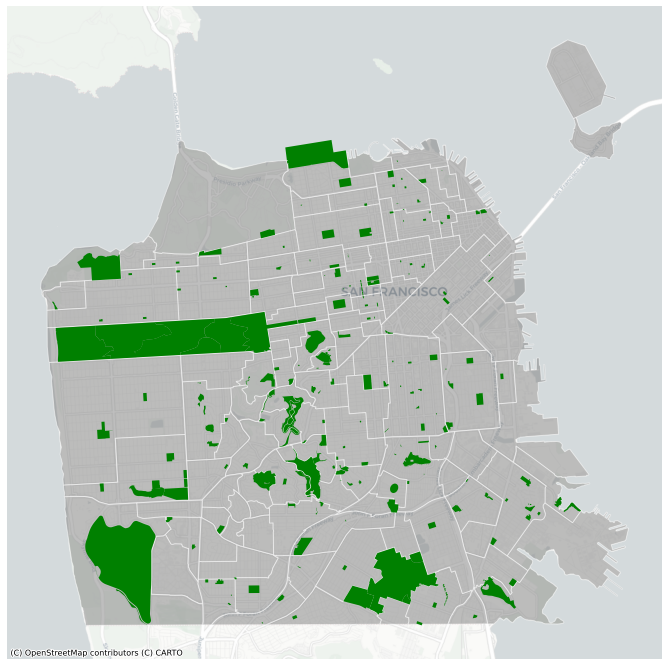

In [98]:
# use the bounding box coordinates to set the x and y limits
base = neighborhoods.plot(figsize=(12,12),
                          color='gray', 
                          edgecolor='white',
                          alpha=0.5)

ax = park_final.plot(ax=base, 
                color='green', 
                markersize=5
               )

base.set_xlim(minx - 1000, maxx + 1000)
base.set_ylim(miny - 1000, maxy + 1000)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

ax

### This map shows neighborhood boundaries with park boundaries overlayed on top. In the next iterrations of our project, we want to overlay incident report data on top to see if there are any clear patterns that emerge in the relationship between parks and incident reports. 

## Lets create a function to see all the parks in a neighborhood with one line of code! 

In [99]:
def map_parks_by_neighborhood(place='Nob Hill'):
    
    neighborhood = neighborhoods[neighborhoods.name==place]

    minx, miny, maxx, maxy = neighborhood.geometry.total_bounds

    parks_in_neighborhood = gpd.sjoin(park_final,neighborhood,how='inner')

    base = neighborhood.plot(figsize=(12,12),
                             color='green', 
                             edgecolor='green',
                             alpha=0.1)

    ax = parks_in_neighborhood.plot(ax=base,
                                    column='map_label',
                                    markersize=40, 
                                    legend=True,
                                    cmap='tab20',
                                    legend_kwds={
                                       'loc': 'upper right',
                                       'bbox_to_anchor':(1.3,1)
                                    }                  
                                )
    
    base.set_xlim(minx - 200, maxx + 200) 
    base.set_ylim(miny - 200, maxy + 200)

    # turn off the axis
    ax.axis('off')

    # add a title
    ax.set_title('Parks in '+neighborhood.name.values[0]+' San Francisco',fontsize=20)

    # add a basemap
    ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
    ax

In [100]:
list(neighborhoods.name)
   

['Seacliff',
 'Lake Street',
 'Presidio National Park',
 'Presidio Terrace',
 'Inner Richmond',
 'Sutro Heights',
 'Lincoln Park / Ft. Miley',
 'Outer Richmond',
 'Golden Gate Park',
 'Presidio Heights',
 'Laurel Heights / Jordan Park',
 'Lone Mountain',
 'Anza Vista',
 'Cow Hollow',
 'Union Street',
 'Nob Hill',
 'Marina',
 'Telegraph Hill',
 'Downtown / Union Square',
 'Tenderloin',
 'Civic Center',
 'Hayes Valley',
 'Alamo Square',
 'Panhandle',
 'Haight Ashbury',
 'Lower Haight',
 'Mint Hill',
 'Duboce Triangle',
 'Cole Valley',
 'Rincon Hill',
 'South Beach',
 'South of Market',
 'Showplace Square',
 'Mission Bay',
 'Yerba Buena Island',
 'Treasure Island',
 'Mission Dolores',
 'Castro',
 'Outer Sunset',
 'Parkside',
 'Stonestown',
 'Parkmerced',
 'Lakeshore',
 'Golden Gate Heights',
 'Forest Hill',
 'West Portal',
 'Clarendon Heights',
 'Midtown Terrace',
 'Laguna Honda',
 'Lower Nob Hill',
 'Upper Market',
 'Dolores Heights',
 'Mission',
 'Potrero Hill',
 'Dogpatch',
 'Central W

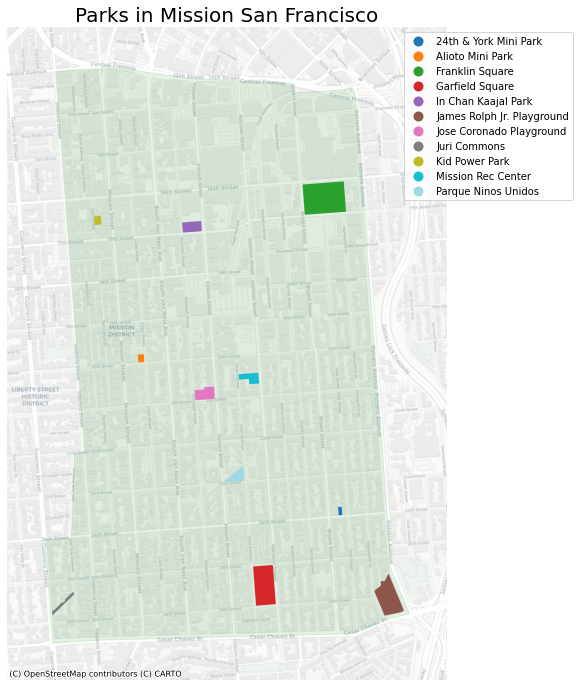

In [101]:
# calling the function
map_parks_by_neighborhood(place='Mission')

### This map shows us all the maps in the Mission neighborhood of San Francisco. 

# Contributions
Sara T. led the cleaning up and visualization of the incident report data and included two functions within that portion of the project.
Sarah D. led the cleaning up and visualization of the park data and included a function within that portion of the project. 